In [1]:
# importing all the necessary modules, provided alongside. Ensure to change the path directory.

# %pwd
# %cd /content/drive/MyDrive/style_transfer/modules
# %run GramMatrix.py
# %run utils.py

%pwd
%cd style_transfer/modules
%run GramMatrix.py
%run utils.py
%cd ..
%cd ..

e:\Study\placement\Dashtoon AIML\style_transfer\modules
e:\Study\placement\Dashtoon AIML\style_transfer
e:\Study\placement\Dashtoon AIML


In [7]:
# creating the StyleCNN architecture that takes as input a content image, a style image, and changes the apperance of the content image according to the style image.

import torch.optim as optim
import torchvision.models as models

# from modules.GramMatrix import *
from GramMatrix import *

class StyleCNNs(object):
    def __init__(self, style, content, pastiche):
        super(StyleCNNs, self).__init__()

        self.style = style
        self.content = content
        self.pastiche = nn.Parameter(pastiche.data)

        self.content_layers = ['conv_4']
        self.style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
        self.content_weight = 1
        self.style_weight = 1000

        self.loss_network = models.vgg19(pretrained=True)

        self.gram = GramMatrix()
        self.loss = nn.MSELoss()
        self.optimizer = optim.LBFGS([self.pastiche])

        self.use_cuda = torch.cuda.is_available()
        if self.use_cuda:
            self.loss_network.cuda()
            self.gram.cuda()

    def train(self):
        def closure():
            self.optimizer.zero_grad()

            pastiche = self.pastiche.clone()
            pastiche.data.clamp_(0, 1)
            content = self.content.clone()
            style = self.style.clone()

            content_loss = 0
            style_loss = 0

            i = 1
            not_inplace = lambda layer: nn.ReLU(inplace=False) if isinstance(layer, nn.ReLU) else layer
            for layer in list(self.loss_network.features):
                layer = not_inplace(layer)
                if self.use_cuda:
                    layer.cuda()

                pastiche, content, style = layer.forward(pastiche), layer.forward(content), layer.forward(style)

                if isinstance(layer, nn.Conv2d):
                    name = "conv_" + str(i)

                    if name in self.content_layers:
                        content_loss += self.loss(pastiche * self.content_weight, content.detach() * self.content_weight)

                    if name in self.style_layers:
                        pastiche_g, style_g = self.gram.forward(pastiche), self.gram.forward(style)
                        style_loss += self.loss(pastiche_g * self.style_weight, style_g.detach() * self.style_weight)

                if isinstance(layer, nn.ReLU):
                    i += 1

            total_loss = content_loss + style_loss
            total_loss.backward()

            return total_loss

        self.optimizer.step(closure)

        return self.pastiche

In [8]:
# defining loader and save_image functions

import torchvision.transforms as transforms
from torch.autograd import Variable

from PIL import Image
import scipy.misc
import imageio

imsize = 256

loader = transforms.Compose([
             transforms.Resize(imsize),
             transforms.ToTensor()
         ])

unloader = transforms.ToPILImage()

def image_loader(image_name):
    image = Image.open(image_name)
    image = Variable(loader(image))
    image = image.unsqueeze(0)
    return image

def save_image(input, path):
    image = input.data.clone().cpu()
    image = image.squeeze(0)
    image = unloader(image)
    imageio.imwrite(path, image)

In [9]:
# main function
# plotting the content, style and output image side by side
# change the path to the directory accordingly

import torch.utils.data
import torchvision.datasets as datasets

from utils import *
import os
import matplotlib.pyplot as plt


def main():

    # CUDA Configurations
    dtype = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

    # content_folder = "/content/drive/MyDrive/style_transfer/TamilContentImages"
    # style_folder = "/content/drive/MyDrive/style_transfer/TamilStyleImages"
    # output_folder = "/content/drive/MyDrive/style_transfer/OutputImages"

    content_folder = "style_transfer/TamilContentImages"
    style_folder = "style_transfer/TamilStyleImages"
    output_folder = "style_transfer/OutputImages"

    # Content and style

    content_images = [os.path.join(content_folder, file) for file in os.listdir(content_folder) if file.endswith(('.jpg', '.png'))]
    style_images = [os.path.join(style_folder, file) for file in os.listdir(style_folder) if file.endswith(('.jpg', '.png'))]


    num_epochs = 31
    for content_image_path, style_image_path in zip(content_images, style_images):
      style = image_loader(style_image_path).type(dtype)
      content = image_loader(content_image_path).type(dtype)

      pastiche = image_loader(content_image_path).type(dtype)
      pastiche.data = torch.randn(pastiche.data.size()).type(dtype)

      style_cnn = StyleCNNs(style, content, pastiche)

      for i in range(num_epochs):
          pastiche = style_cnn.train()

          if i == 30:
              path = os.path.join(output_folder, f"{os.path.basename(content_image_path)}_{os.path.basename(style_image_path)}_{i}.png")
              pastiche.data.clamp_(0, 1)
              save_image(pastiche, path)

      image_paths = [content_image_path, style_image_path, path]
      images = [imageio.imread(path) for path in image_paths]

      fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
      i = 0
      for ax, image, path in zip(axes, images, image_paths):
          ax.imshow(image, aspect='auto', extent=[0,1,0,1])
          ax.axis('off')
          if i == 0:
              ax.set_title('Content')
          elif i == 1:
              ax.set_title('Style')
          else:
              ax.set_title('Output')
          i += 1

      plt.show()

e:\Tools\miniconda\envs\yolov7gpu\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Tools\miniconda\envs\yolov7gpu\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to C:\Users\manda/.cache\torch\hub\checkpoints\vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:27<00:00, 20.7MB/s] 
C:\Users\manda\AppData\Local\Temp\ipykernel_19488\2358206482.py:51: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v

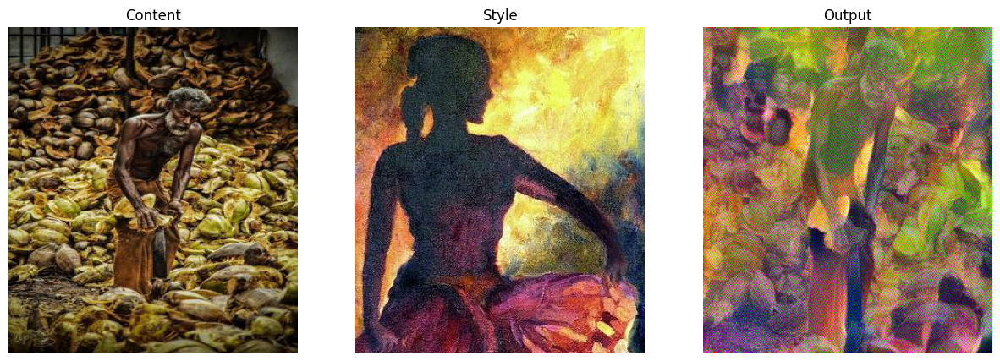

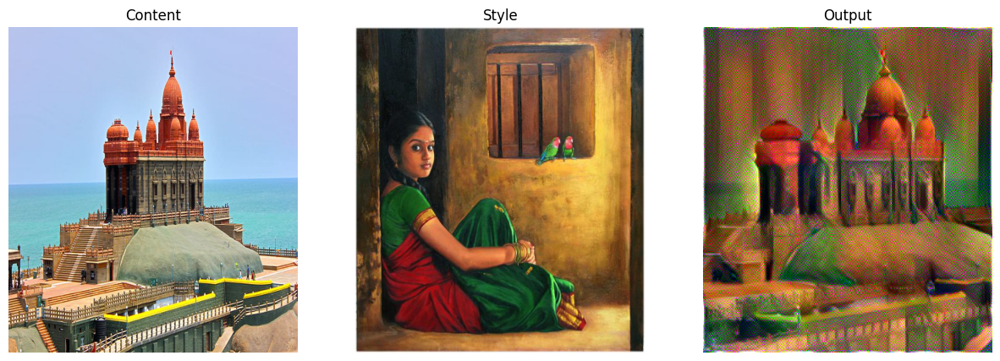

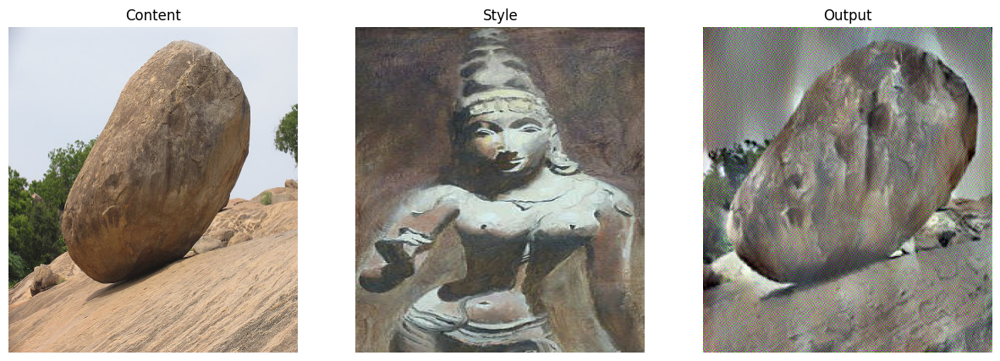

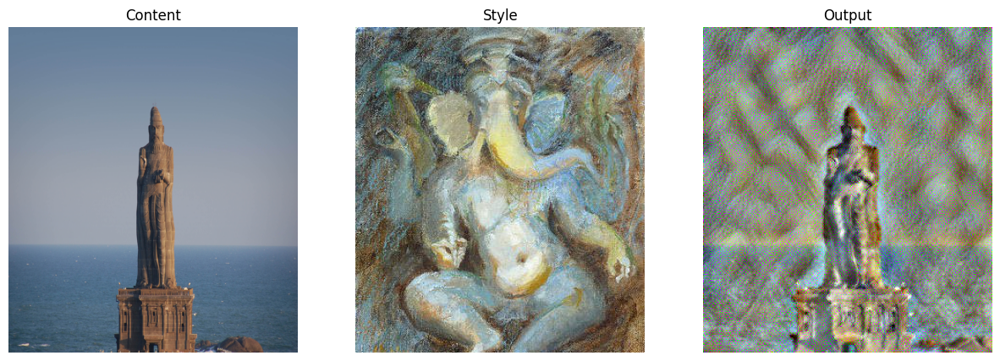

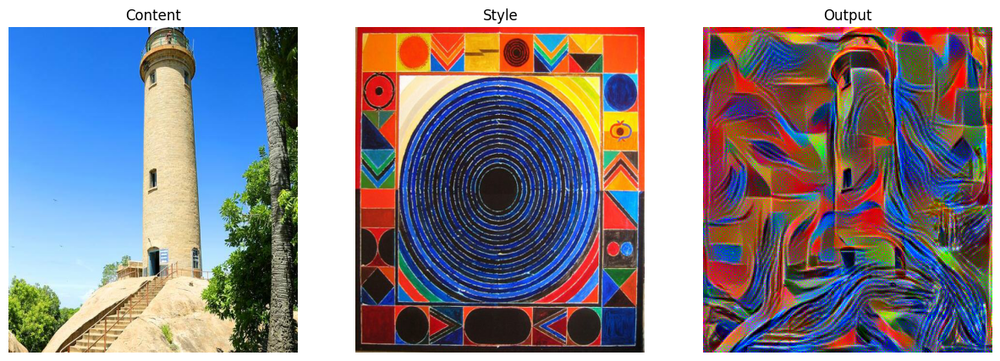

...

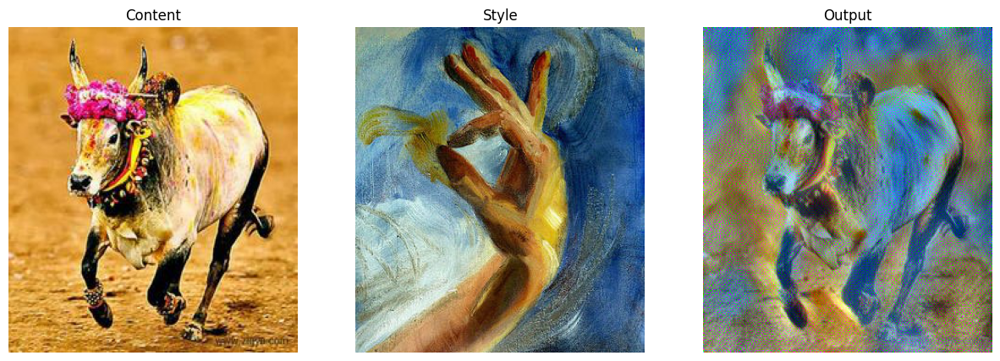

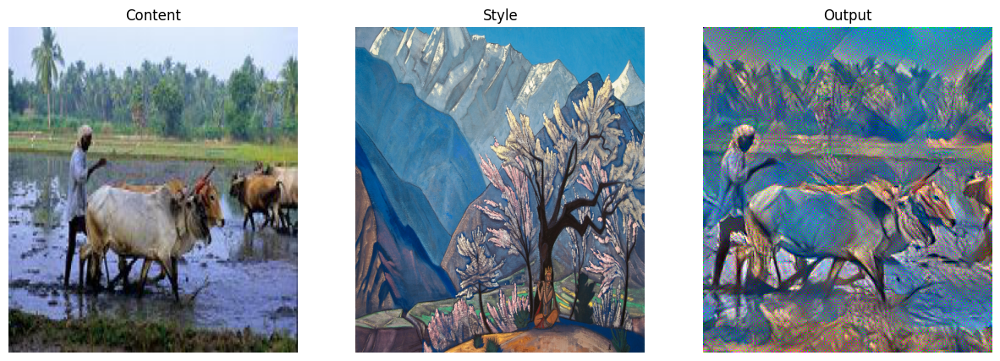

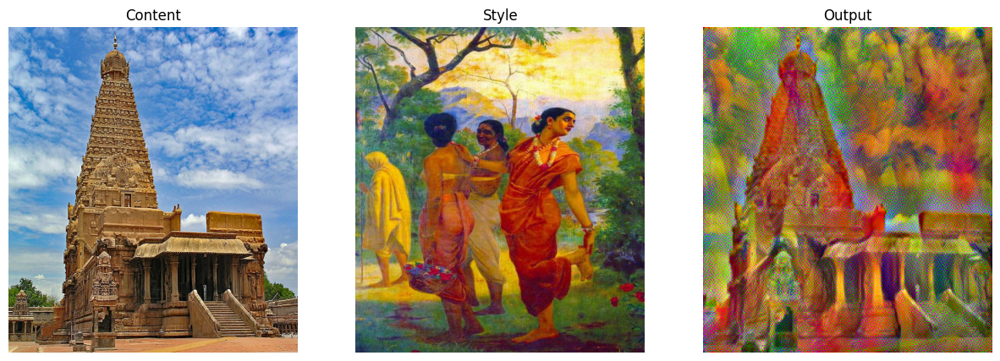

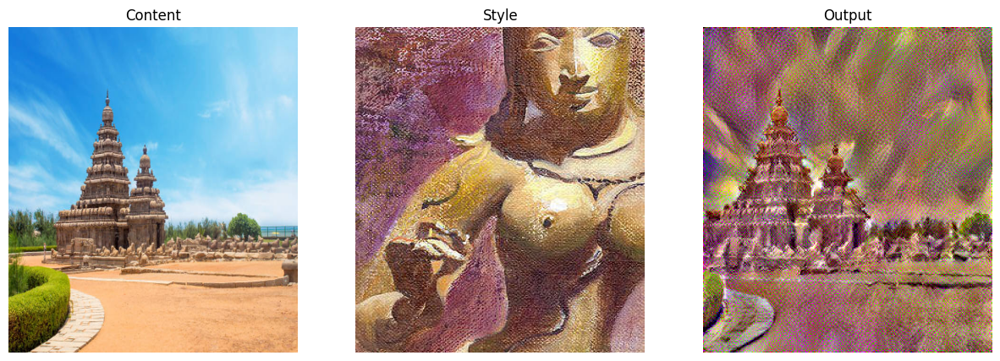

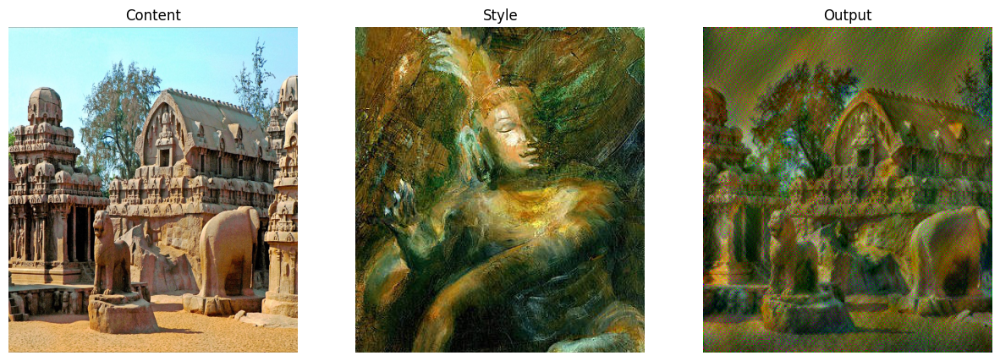

In [10]:
#calling the main function
main()

#Neural Style Transfer Algorithm

The Style Transfer algorithm implemented in StyleCNNs uses a pre-trained VGG-19 neural network to extract features from the style, content, and pastiche (output) images. It then minimizes the content loss and style loss to generate an image that combines the content of the content image with the artistic style of the style image.

**Content Loss:** Measures the difference in content between the pastiche and content images. It is the mean squared error between the feature maps of a chosen layer (e.g., conv_4).

**Style Loss:** Measures the difference in artistic style between the pastiche and style images. It is the mean squared error between the Gram matrices of feature maps from multiple layers (e.g., conv_1 to conv_5).

**Optimization:** The LBFGS optimizer is used to minimize the total loss, which is the sum of the content and style losses.

**Closure Function:** A closure function is defined for the optimizer. This function computes and backpropagates the total loss.

We run the model for **30 epochs**, and for each set of input images, we display the content, style and ouptut images.